In [1]:
#import required library

import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import cvlib as cv
from cvlib.object_detection import draw_bbox

In [2]:
#vehicle count model from an given image
               #returns number of vechiles in given image
    

def myModel(image):
    
    #image = image_path
    #image = cv2.imread(image_path)
    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    box,label,count = cv.detect_common_objects(image)
    output = draw_bbox(image,box,label,count)
    
    output = cv2.cvtColor(output, cv2.COLOR_BGR2GRAY)
    
    return len(label)

### Due to unavailibility of aruduino board we are using here a downloaded dataset 
### The code for aruduino is mentioned in commented form as required

In [3]:
#function from loading all images from folder

def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename))
        if img is not None:
            images.append(img)
    return images

In [4]:
#loading all images from folder
               #i.e's calling the load_images_from_folder function

folder = "C:\\Users\\HP\\Downloads\\archive\\batch"
images = load_images_from_folder(folder)

In [5]:
print(len(images))

150


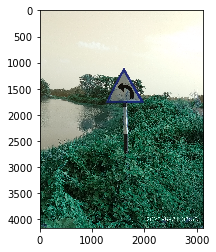

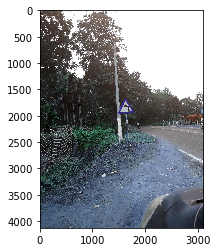

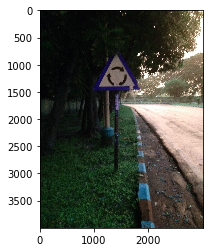

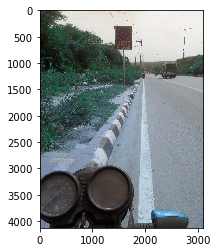

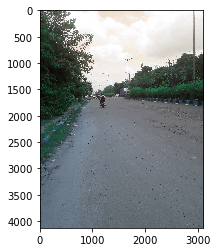

...

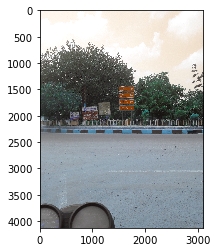

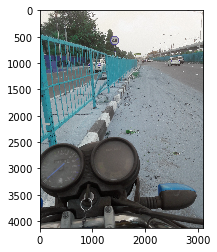

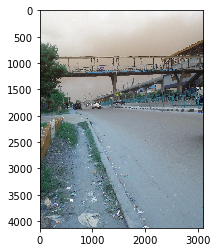

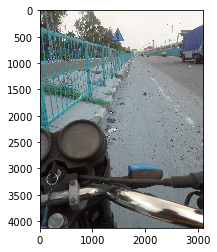

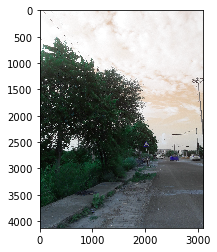

In [6]:
for i in range(150):
    plt.imshow(images[i], interpolation='nearest')
    plt.show()

In [7]:
#function that returns array of  length of vechiles of all four sides of  crossroad in single cycle


counter=0
def den_gen(images):
    global counter
    d=[]
    for i in range(4):
        
        x = myModel(images[counter+i])
        d.append(x)
       
    counter +=4
    return d 




#image_path = input("Enter image path :")
#image_path = C:\\Users\\HP\\OneDrive\\Desktop\\Me\\Concetto\\Images\\coin_counting_Image.png
#print("\n\n\n",myModel(image_path),"\n\n")

In [8]:
d = den_gen(images)

In [9]:
def signal_out(a):
  mx=max(a)
  #checking for no vehicle condition
  if 0 in a:
    ind=a.index(0)
    signal[ind]=0
  ind=a.index(mx)
  signal[ind]=1
  out=signal
  return out,mx

In [10]:
#array of signals corresponding to all 4 routes
signal=[0,0,0,0]

In [11]:
#following code runs for controlling arduino
#pip install machine

In [12]:
import serial
import time
#from machine import Pin

In [13]:
#dev = serial.Serial("COM4", baudrate=19200)

In [14]:
#led1=Pin(11, Pin.OUT)
#led2=Pin(12, Pin.OUT)
#led3=Pin(13, Pin.OUT)
#led4=Pin(14, Pin.OUT)


In [15]:
global run
run=int(input("enter the no of iterations needed :"))
#here you can set iterations needed for the day's operation

enter the no of iterations needed :12


In [16]:
#commented codes run to communicate with attached arduiono board
while(run>0):
    c=4
    mx=0
    d=den_gen(images)
    sum= np.sum(d)
    while(c>0):
      arr,mx=signal_out(d)
      on=arr.index(1)
      if on==0:
        arr[0]=1
        #led1.value(0)
      elif on==1:
        arr[1]=1
        #led.value(0)
      elif on==2:
        #led3.value(0)
        arr[2]=1
      elif on==3:
        #led4.value(0)
        arr[3]=1  
      t=(mx/sum)
      print("time lapse :",t)
      time.sleep(t)
      d[d.index(mx)]=-1
      print(arr)
      for i in range(0,len(arr)):
            arr[i]=0
      #led1.value(1)
      #led2.value(1)
      #led3.value(1)
      #led4.value(1)
      c=c-1
    run=run-1
    del d
    
    
#0 signifies red traffic light
#1 signifies green traffic light

time lapse : 0.4666666666666667
[0, 0, 0, 1]
time lapse : 0.2
[1, 0, 0, 0]
time lapse : 0.2
[0, 1, 0, 0]
time lapse : 0.13333333333333333
[0, 0, 1, 0]
time lapse : 0.45454545454545453
[1, 0, 0, 0]
time lapse : 0.45454545454545453
[0, 0, 0, 1]
time lapse : 0.09090909090909091
[0, 0, 1, 0]
time lapse : 0.0
[0, 1, 0, 0]
time lapse : 0.4
[0, 1, 0, 0]
time lapse : 0.3
[0, 0, 1, 0]
time lapse : 0.3
[0, 0, 0, 1]
time lapse : 0.0
[1, 0, 0, 0]
time lapse : 0.5
[0, 0, 1, 0]
time lapse : 0.375
[1, 0, 0, 0]
time lapse : 0.125
[0, 1, 0, 0]
time lapse : 0.0
[0, 0, 0, 1]
time lapse : 0.7222222222222222
[1, 0, 0, 0]
time lapse : 0.16666666666666666
[0, 1, 0, 0]
time lapse : 0.1111111111111111
[0, 0, 0, 1]
time lapse : 0.0
[0, 0, 1, 0]
time lapse : 0.42857142857142855
[0, 0, 0, 1]
time lapse : 0.2857142857142857
[1, 0, 0, 0]
time lapse : 0.14285714285714285
[0, 1, 0, 0]
time lapse : 0.14285714285714285
[0, 0, 1, 0]
time lapse : 0.6
[0, 0, 0, 1]
time lapse : 0.3
[0, 1, 0, 0]
time lapse : 0.1
[0, 0, 1, 0